# Street Network Analysis - Islington, London, UK

### GEOG0015 Mining Social & Geographic Datasets

This page will cover a walking street network analysis of Islington, that will identify centrality in the neighborhood and identify where additional retail/commercial buildings could be placed in accordance with centrality. First we'll begin by uploading our libraries, loading our network graphs, running centrality and finally developing a land use analysis. 

In [2]:
#load libraries 
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import osmnx as ox # this line imports osmnx
import networkx as nx # this line imports networkx
import matplotlib.cm as cm
import matplotlib.colors as colors
#from IPython.display import IFrame
#ox.config(log_console=True, use_cache=True)

import sys
print (f'current environment: {sys.prefix}')

if ox.__version__=='2.0.1':
    #prints OSMNx version 
    print (f'current osmnx version: {ox.__version__}') 
else:
    #recommends student to upgrade to newer osmnx version.
    print (f'current osmnx version: {ox.__version__}. student might need to upgrade to osmnx=2.0.1 for the notebook to work')


current environment: /opt/anaconda3/envs/envGEOG0051
current osmnx version: 2.0.1


### Load Graph

In [3]:
# Load graph of Islington for a walking street network and 2000m radius
G=ox.graph_from_address('Islington, London, UK', dist=2000, network_type='walk')

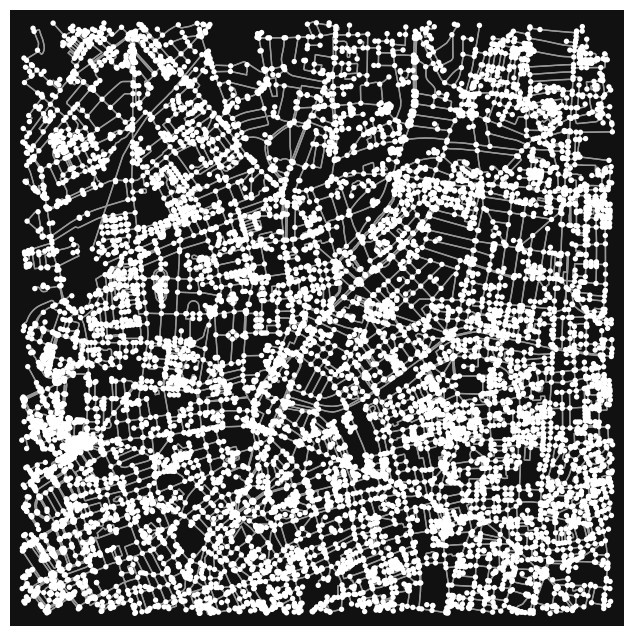

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [4]:
#plot the graph
ox.plot_graph(G)

### Betweenness Centrality

First, we'll begin by calculating betweenness centrality in Islington. From the plot below, we notice single path with the highest centrality. This street is the path along the Regents Canal running from the Angel Station to the Rosemary Gardens. In other words, this path along the canal has the highest count of acting as a stop/bridge along the shortest path between any other pair of streets. People usually need to walk along this path if they want to get any other place in Islington on the shortest path. 

In [5]:
#first set as diGraph
DG = ox.convert.to_digraph(G)

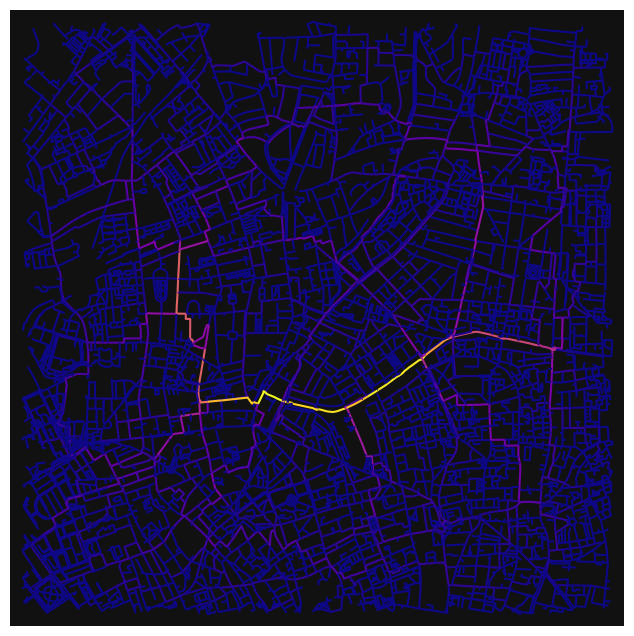

In [7]:
#calculate edge betweenness centrality
#convert graph to a line graph so edges become nodes and vice versa
edge_bc = nx.betweenness_centrality(nx.line_graph(DG))

#set measure of each node as edge attribute of the graph network object
nx.set_edge_attributes(DG,edge_bc,'bc')
G1 = nx.MultiGraph(DG)

#set color & plot 
nc = ox.plot.get_edge_colors_by_attr(G1, 'bc', cmap='plasma')
fig, ax = ox.plot_graph(G1, node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=nc, edge_linewidth=1.5, edge_alpha=1)

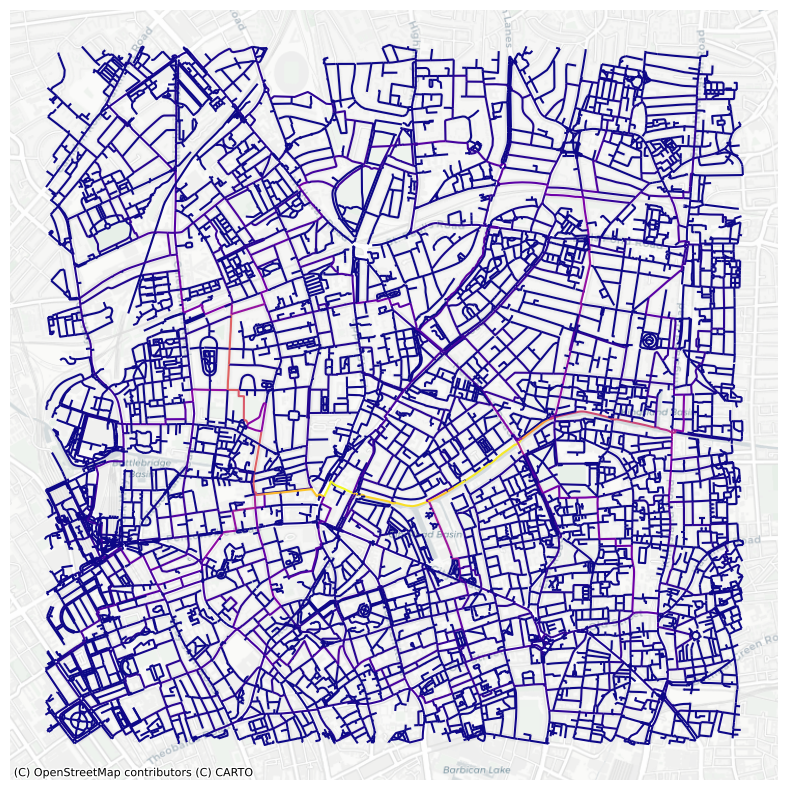

In [8]:
# convert graph to geopandas dataframe
gdf_edges = ox.graph_to_gdfs(G1,nodes=False,fill_edge_geometry=True)

# set crs to 3857 (needed for contextily)
gdf_edges = gdf_edges.to_crs(epsg=3857) # setting crs to 3857

# plot edges according to degree centrality
ax=gdf_edges.plot('bc',cmap='plasma',figsize=(10,10))

# add a basemap using contextilly
import contextily as ctx
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

### Closeness Centrality

Next, we'll calculate closeness centrality and compare these results to the betweeness centrality. Here, again, the same path along Regents Canal has the highest centrality. This means that this path along the canal is the closest central point in Islington to all other parts in the city. In other points, it's the most connected junction across Isligton.

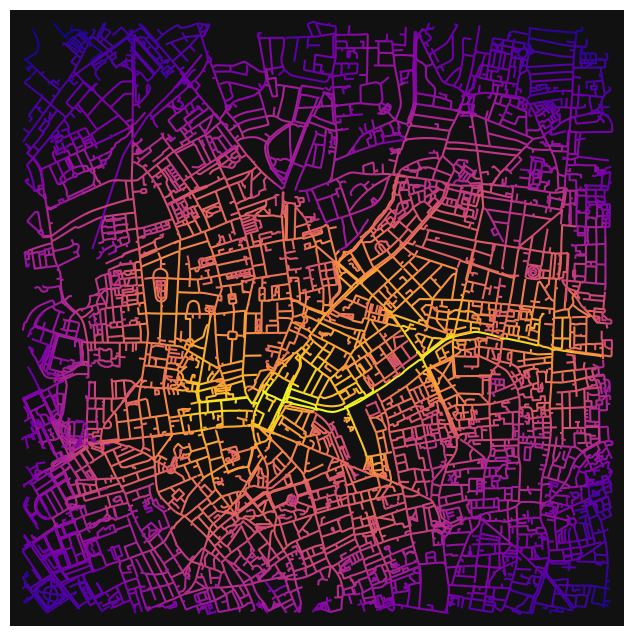

In [9]:
#calculate edge closeness centrality
#convert graph to a line graph so edges become nodes and vice versa
edge_cc = nx.closeness_centrality(nx.line_graph(DG))

#set measure of each node as edge attribute of the graph network object
nx.set_edge_attributes(DG,edge_cc,'cc')
G2 = nx.MultiGraph(DG)

#set color & plot 
nc = ox.plot.get_edge_colors_by_attr(G2, 'cc', cmap='plasma')
fig, ax = ox.plot_graph(G2, node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=nc, edge_linewidth=1.5, edge_alpha=1)

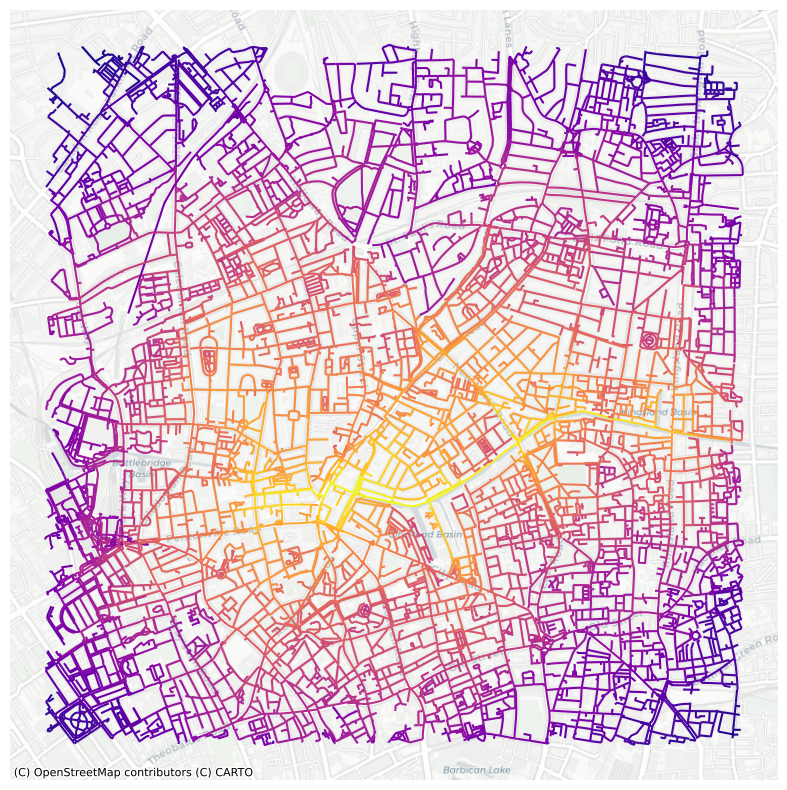

In [10]:
# convert graph to geopandas dataframe
gdf_edges2 = ox.graph_to_gdfs(G2,nodes=False,fill_edge_geometry=True)

# set crs to 3857 (needed for contextily)
gdf_edges2 = gdf_edges2.to_crs(epsg=3857) # setting crs to 3857

# plot edges according to degree centrality
ax2=gdf_edges2.plot('cc',cmap='plasma',figsize=(10,10))

# add a basemap using contextilly
import contextily as ctx
ctx.add_basemap(ax2,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

### Urban Form/Land Use Analysis

Now that we've identified the most integrated path in our Islington street network, we'll review the land use in our street network. From the last two plots below, we can see how many (if any) retail or commercial buildings are used along the canal. 

First, the canal runs off of the 'City Road Basin'. As expected, there is a high concentration on the western side of the canal, which is where the Angel Tube Station is located. There are many retail shops there - however, along the rest of the canal, there is little to no retail, bar/pub, cafe, or commercial use. 

To take full advantage of the space, businesses may look to evaluate where they could create space for restuarants or shops as a way for people to stop by as they walk between destinations. The Regent's Canal is a popular space across London, and while it may be more utilized a commericial space in other parts of the city, the section that crosses Islignton is primarily used for residences, churches, hosptials, and more. 

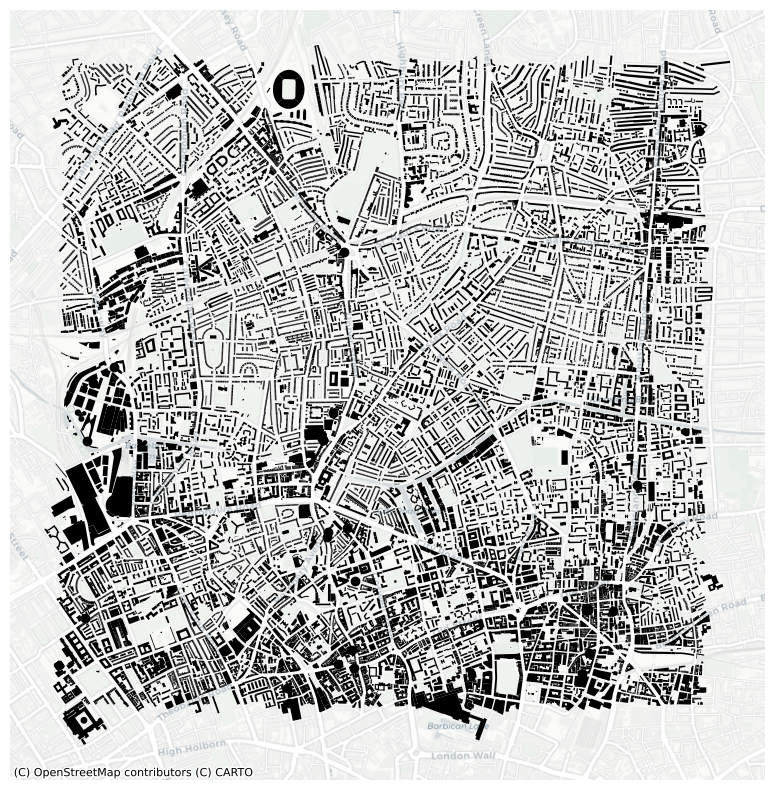

In [15]:
# obtain geometries of a place similar to getting a graph 
tags= tags={'amenity': True, 'highway':True, 'landuse':True, 'building':True, 'waterway': True, 'railway': True}
all_geom=ox.features_from_address('Islington, London,UK', tags, dist=2000)
all_geom = all_geom.to_crs(epsg=3857)

# plot
fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['building'].notna()].plot(ax=ax,color='black')
import contextily as ctx
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

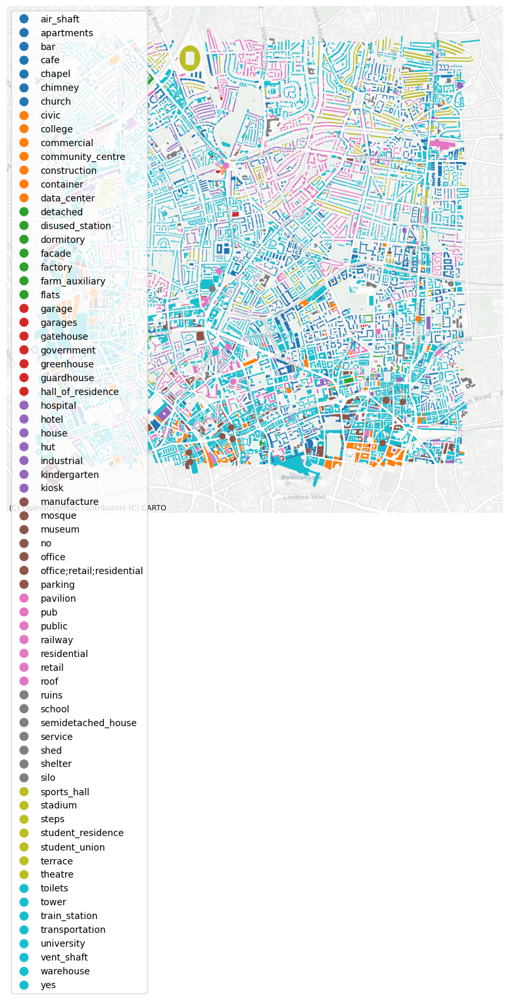

In [17]:
#lets take a look at how buildings are allocated by category 

fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['building'].notna()].plot('building',
                                            ax=ax,
                                            categorical=True,
                                            legend=True)
import contextily as ctx
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

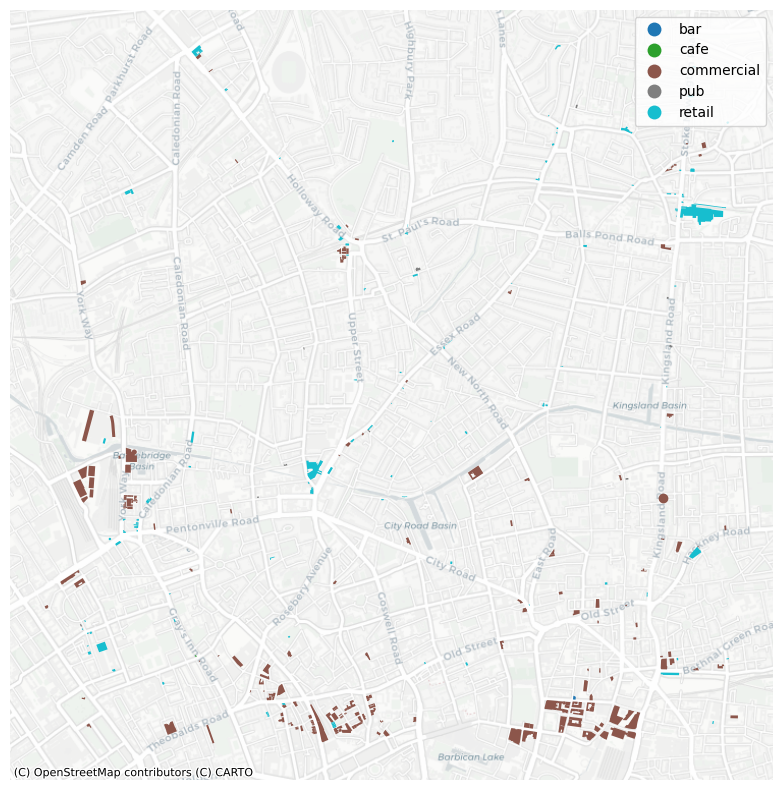

In [23]:
#now lets just categorize by retail

fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['building'].isin(['retail', 'pub', 'cafe', 'bar', 'commercial'])].plot('building',
                                            ax=ax,
                                            categorical=True,
                                            legend=True)
import contextily as ctx
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

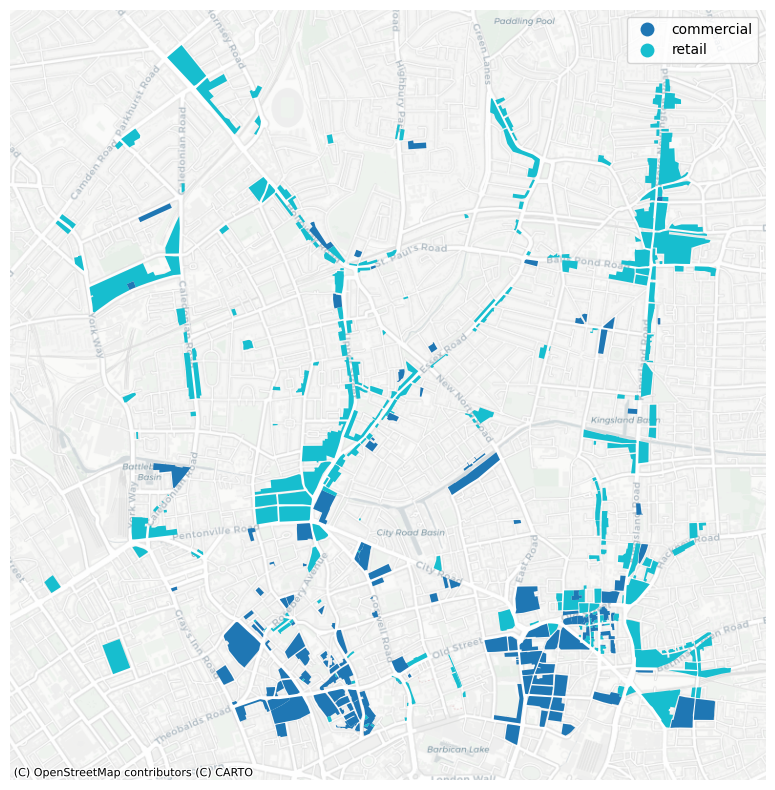

In [26]:
#now lets look at land use for retail allocation 

fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['landuse'].isin(['retail','commercial'])].plot('landuse',
                                            ax=ax,
                                            categorical=True,
                                            legend=True)
import contextily as ctx
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()